In [1]:
#coherence

In [2]:
%reload_ext autoreload
%autoreload 2
import pynwb
import os

#DataJoint and DataJoint schema
import datajoint as dj
import numpy as np
import pandas as pd

## We also import a bunch of tables so that we can call them easily

from nwb_datajoint.common import (RawPosition, HeadDir, Speed, LinPos, StateScriptFile, VideoFile,
                                  DataAcquisitionDevice, CameraDevice, Probe,
                                  DIOEvents,
                                  ElectrodeGroup, Electrode, Raw, SampleCount,
                                  LFPSelection, LFP, LFPBandSelection, LFPBand,
                                  FirFilter,
                                  IntervalList,
                                  Lab, LabMember, LabTeam, Institution,
                                  BrainRegion,
                                  SensorData,
                                  Session, ExperimenterList,
                                  Subject,
                                  Task, TaskEpoch,
                                  Nwbfile, AnalysisNwbfile, NwbfileKachery, AnalysisNwbfileKachery,
                                  get_electrode_indices)
from nwb_datajoint.common.common_position import (PositionInfoParameters,IntervalPositionInfo)
from nwb_datajoint.common.common_interval import interval_list_intersect



from plot_lfp import (get_x_y_list, get_speed, get_timestamps_and_data,get_electrode_ids,remove_dead_tet_chans,check_for_dead_probes,
                      checking_other_dead_tets,simple_plot,plot_overlay,plot_overlay_with_pos,plot_speed_versus_theta, find_overlapping_times,get_x_y_timestamp_list)

import re
import matplotlib.pyplot as plt
import warnings
from ripple_detection.detectors import Kay_ripple_detector

warnings.simplefilter('ignore', category=DeprecationWarning)
warnings.simplefilter('ignore', category=ResourceWarning)

Connecting emonroe@lmf-db.cin.ucsf.edu:3306


/home/emonroe/miniconda2/envs/nwb_datajoint/lib/python3.8/site-packages/position_tools/core.py:3: DeprecationWarning: Please use `gaussian_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter1d


In [3]:
nwb_file_name = 'senor20201030_.nwb'

In [284]:
theta_timestamps, theta_data, theta_eseries = get_timestamps_and_data(nwb_file_name,filter_type=['Theta 5-11 Hz'],data_type = ['theta'])
lfp_timestamps, lfp_data, lfp_eseries = get_timestamps_and_data(nwb_file_name,data_type = ['lfp'])


position_info = (IntervalPositionInfo() &
                 {'nwb_file_name': nwb_file_name,
                  'interval_list_name': 'pos 1 valid times',
                  'position_info_param_name': 'default'}
                ).fetch1_dataframe()

In [662]:
# tetrodes 1-12 in left ca1,
# tets 13-24 in right ca1
# probe 1- id 32- ni left pfc, probe 2, id 33 in right pfc 

# so...
(Electrode() & {'nwb_file_name': nwb_file_name}) & {'electrode_id':40}

nwb_file_name name of the NWB file,electrode_group_name electrode group name from NWBFile,electrode_id the unique number for this electrode,probe_type,probe_shank shank number within probe,probe_electrode electrode,region_id,name unique label for each contact,original_reference_electrode the configured reference electrode for this electrode,x the x coordinate of the electrode position in the brain,y the y coordinate of the electrode position in the brain,z the z coordinate of the electrode position in the brain,filtering description of the signal filtering,impedance electrode impedance,"bad_channel if electrode is ""good"" or ""bad"" as observed during recording",x_warped x coordinate of electrode position warped to common template brain,y_warped y coordinate of electrode position warped to common template brain,z_warped z coordinate of electrode position warped to common template brain,contacts label of electrode contacts used for a bipolar signal - current workaround
senor20201030_.nwb,10,40,tetrode_12.5,0,0,6,40,17,0.0,0.0,0.0,None,0.0,False,0.0,0.0,0.0,


In [718]:
electrode_id = [17,40,132,300]
time_from_start = 300 #in seconds
time_interval_s = 60
sampling_rate_lfp = 1000
epoch = (IntervalList & {'nwb_file_name':nwb_file_name} & {'interval_list_name':'02_r1'}).fetch1('valid_times')
x_elect_theta, y_elect_theta =get_x_y_list(time_from_start, time_interval_s,epoch, electrode_id, theta_eseries, theta_timestamps, theta_data)
x_pos,y_pos = get_speed(position_info,epoch,time_from_start,time_interval_s)

x_elect_lfp, y_elect_lfp = get_x_y_list(time_from_start, time_interval_s,epoch, electrode_id, lfp_eseries, lfp_timestamps, lfp_data)





In [447]:
from nwb_datajoint.common.signal_processing import hilbert_decomp
from scipy import signal as sig



In [131]:
# electrode_id = [40,300]
# time_from_start = 500 #in seconds
# time_interval_s = 60
# sampling_rate_lfp = 1000
# epoch = (IntervalList & {'nwb_file_name':nwb_file_name} & {'interval_list_name':'02_r1'}).fetch1('valid_times')
# x_elect_theta, y_elect_theta =get_x_y_list(time_from_start, time_interval_s,epoch, electrode_id, theta_eseries, theta_timestamps, theta_data)
# x_pos,y_pos = get_speed(position_info,epoch,time_from_start,time_interval_s)





# f, t, Sxx = signal.spectrogram(y_elect_theta[0], 1000)
# plt.pcolormesh(t, f, Sxx, shading='gouraud')
# plt.ylabel('Frequency [Hz]')
# plt.xlabel('Time [sec]')
# plt.ylim(0,60)
# plt.show()
# plt.plot(y_elect_theta[0])


# http://www.radio-science.net/2017/10/dynamic-spectrum-spectrogram-using.html
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.spectrogram.html


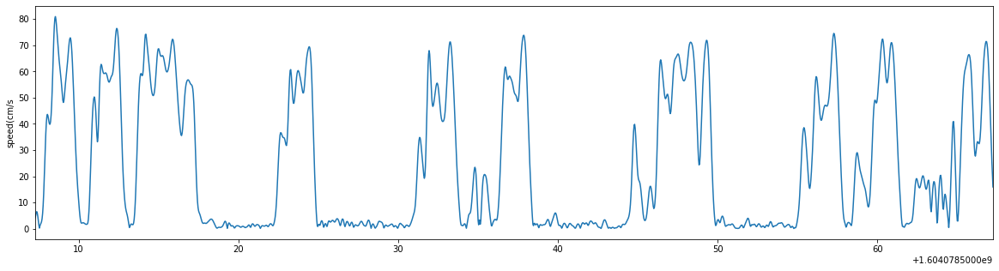

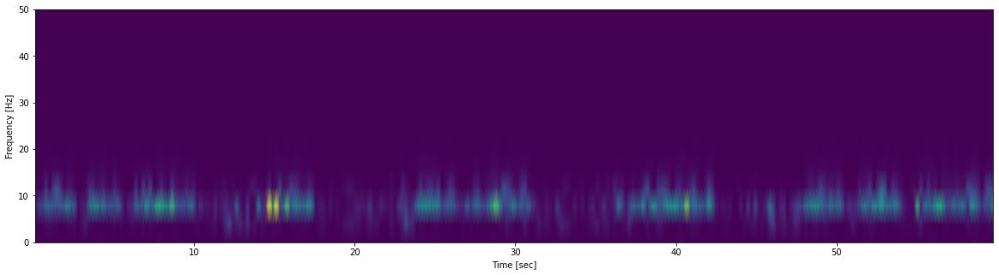

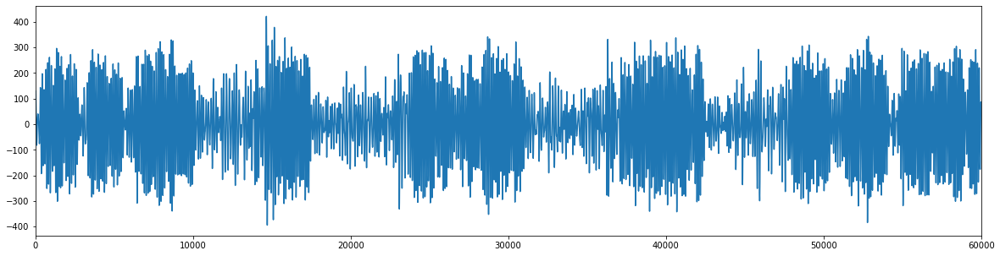

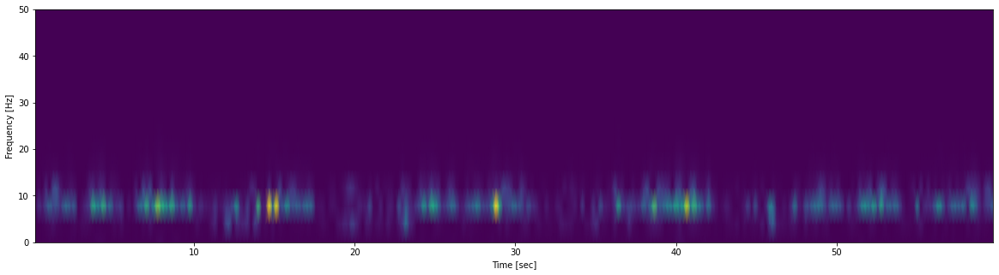

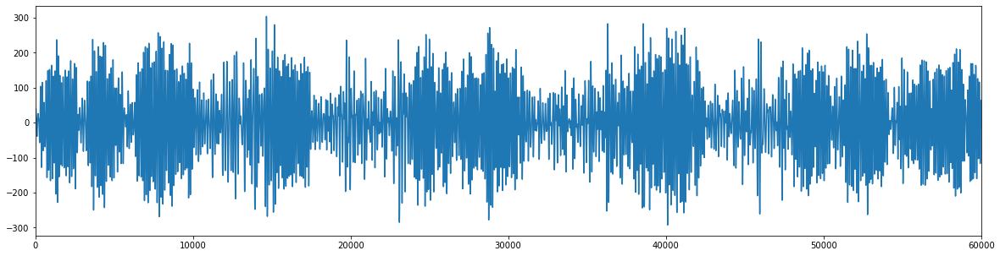

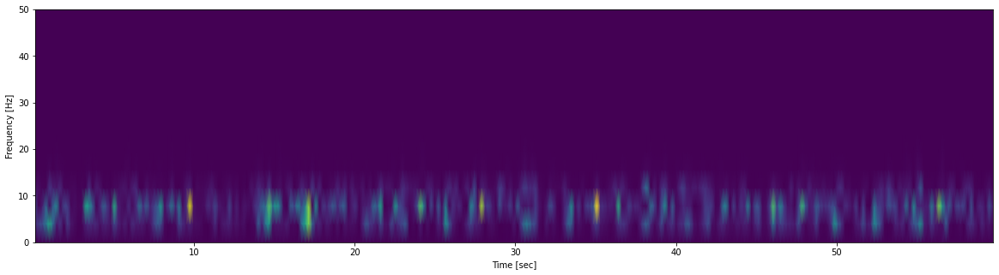

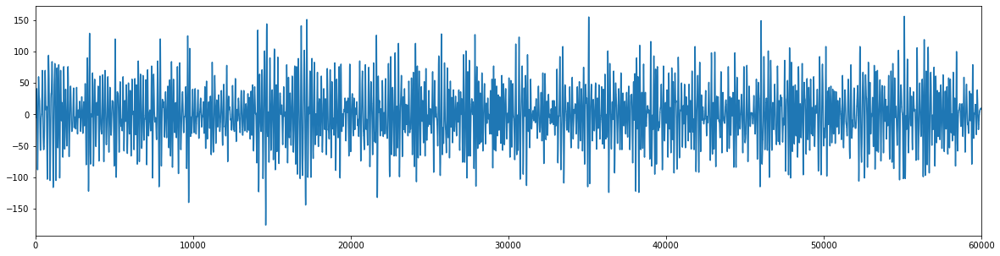

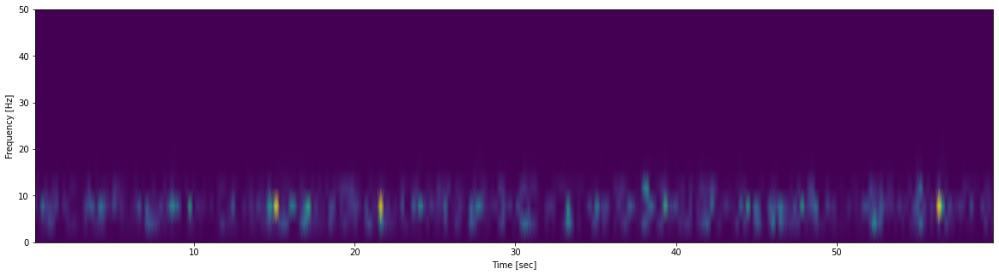

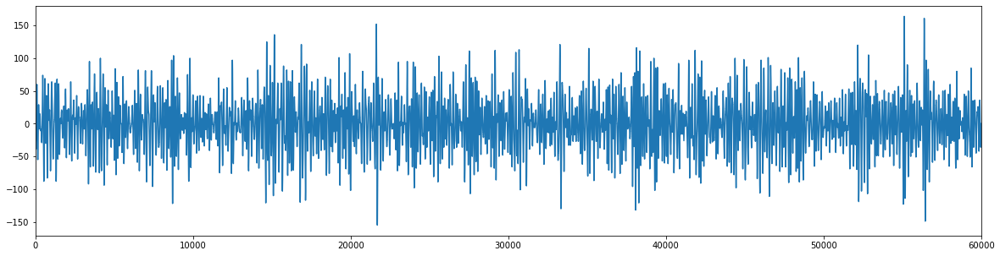

In [719]:
plt.figure(figsize=(20,5))
plt.plot(x_pos,y_pos)
plt.ylabel('speed(cm/s')
plt.xlim(x_pos.min(),x_pos.max())
for ix in range(len(y_elect_theta)):
    plt.figure(figsize=(20,5))
    f, t, Sxx = sig.spectrogram(y_elect_theta[ix], 1000)
    plt.pcolormesh(t, f, Sxx, shading='gouraud')
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    plt.ylim(0,50)
    plt.show()
    plt.figure(figsize=(20,5))
    plt.plot(y_elect_theta[ix])
    plt.xlim(0,len(y_elect_theta[ix]))





Text(0, 0.5, 'coherence')

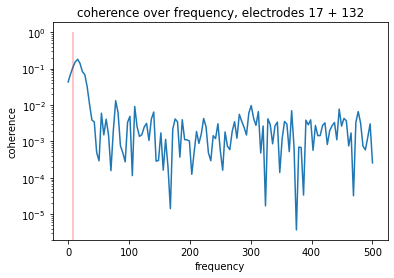

In [720]:
from scipy.signal import coherence
electrode_ix1= 0
electrode_ix2 = 2

x = y_elect_theta[electrode_ix1]
y = y_elect_theta[electrode_ix2]

f, Cxy = coherence(x, y, fs=1000)
plt.semilogy(f, Cxy)
plt.vlines(8,0,1, 'red', alpha=.3)

plt.title(f'coherence over frequency, electrodes {electrode_id[electrode_ix1]} + {electrode_id[electrode_ix2]}')
plt.xlabel('frequency')
plt.ylabel('coherence')


Text(0.5, 1.0, 'coherence over frequencies, electrodes 17 + 132')

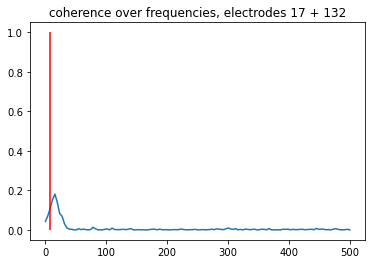

In [721]:
plt.plot(f, Cxy)
plt.vlines(8,0,1, color='red')
plt.title(f'coherence over frequencies, electrodes {electrode_id[electrode_ix1]} + {electrode_id[electrode_ix2]}')

#one quesiton, why doesnt this one go up to 500? 

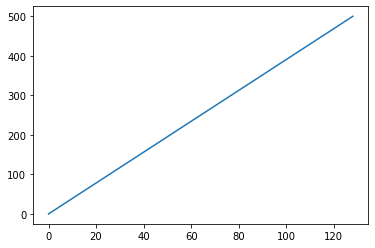

In [302]:
plt.plot(f)

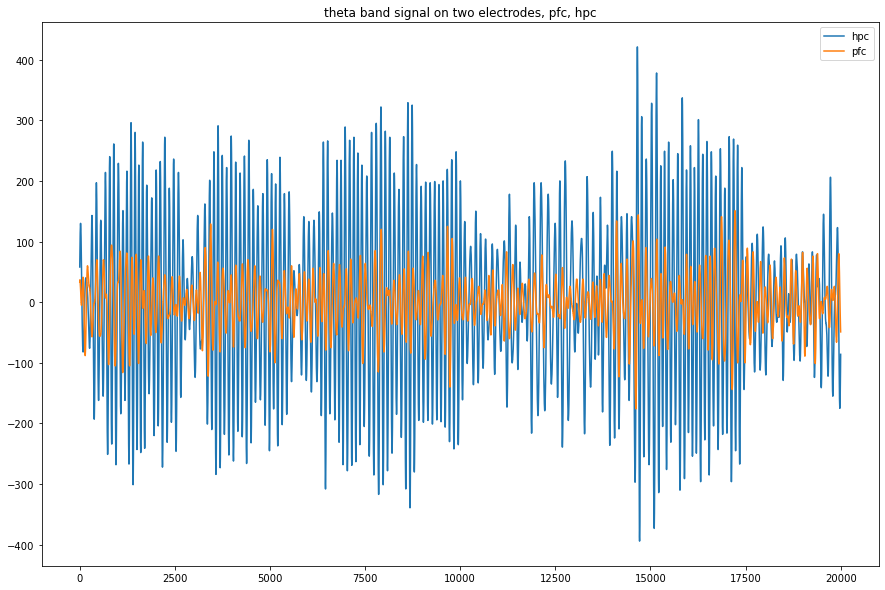

In [667]:
plt.figure(figsize=(15,10))
plt.plot(x,label='hpc')
plt.plot(y,label='pfc')
plt.title('theta band signal on two electrodes, pfc, hpc')
plt.legend()

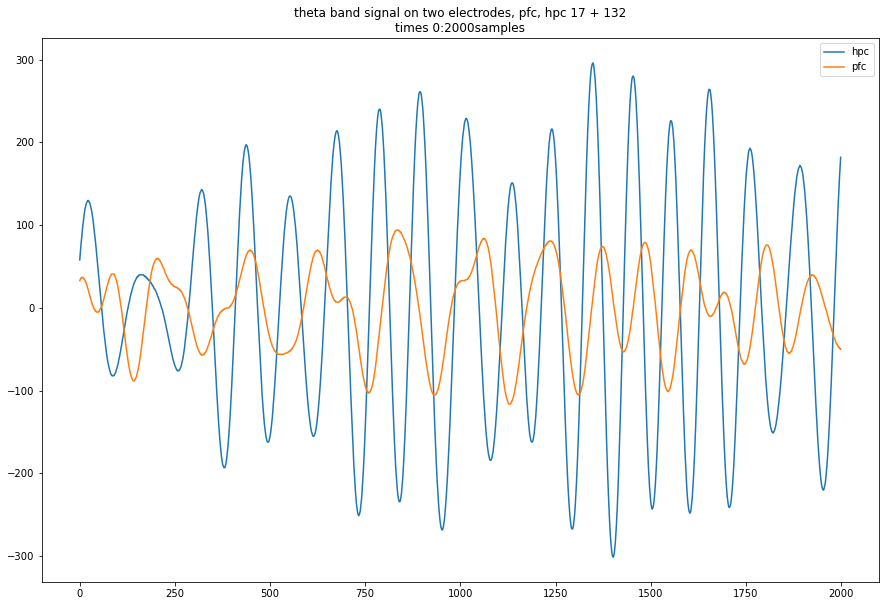

In [668]:
t_start = 0
t_end = 2000
x_seg = x[t_start:t_end]
y_seg = y[t_start:t_end]
plt.figure(figsize=(15,10))
plt.plot(x_seg,label='hpc')
plt.plot(y_seg,label='pfc')
plt.title(f'theta band signal on two electrodes, pfc, hpc {electrode_id[electrode_ix1]} + {electrode_id[electrode_ix2]}\ntimes {t_start}:{t_end}samples')
plt.legend()

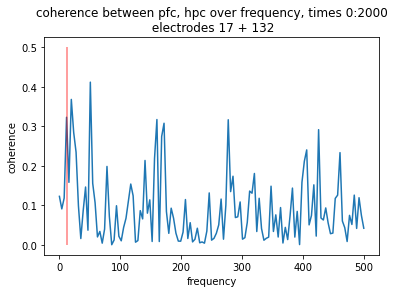

In [669]:
f, Cxy = coherence(x_seg, y_seg, fs=1000)

plt.plot(f, Cxy)
plt.title(f'coherence between pfc, hpc over frequency, times {t_start}:{t_end}\n electrodes {electrode_id[electrode_ix1]} + {electrode_id[electrode_ix2]}')
plt.xlabel('frequency')
plt.ylabel('coherence')
plt.vlines(12,0,.5,color='red',alpha=.5)

Text(0, 0.5, 'coherence')

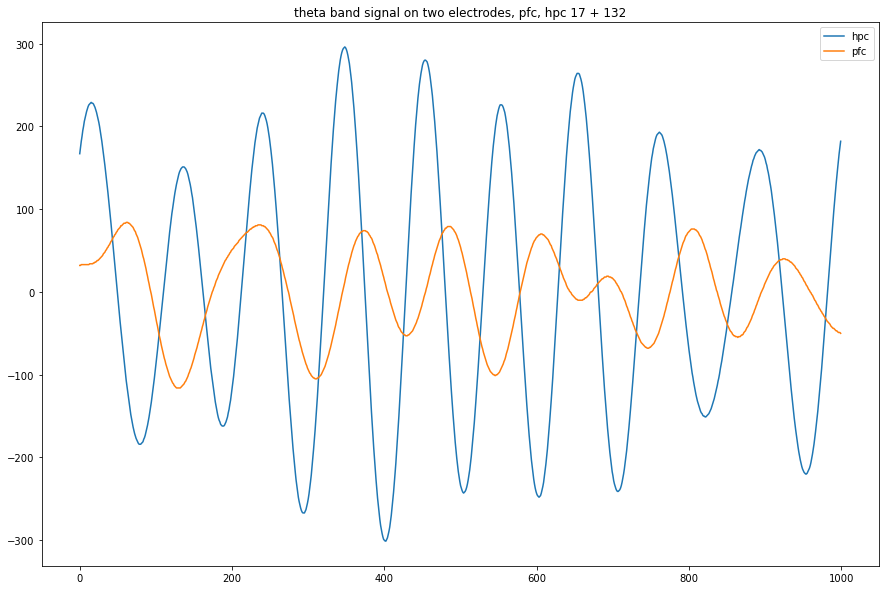

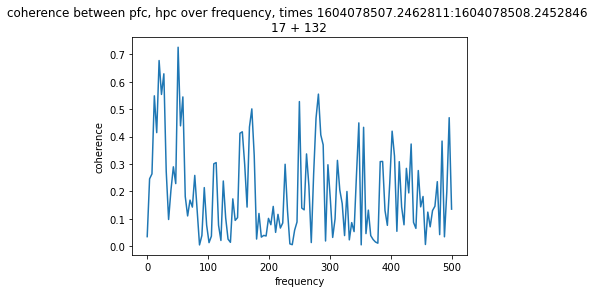

In [670]:
t_start = 1000
t_end = 2000
x_seg = x[t_start:t_end]
y_seg = y[t_start:t_end]
plt.figure(figsize=(15,10))
plt.plot(x_seg,label='hpc')
plt.plot(y_seg,label='pfc')
plt.title(f'theta band signal on two electrodes, pfc, hpc {electrode_id[electrode_ix1]} + {electrode_id[electrode_ix2]}')
plt.legend()
plt.figure()
f, Cxy = coherence(x_seg, y_seg, fs=1000)

plt.plot(f, Cxy)
plt.title(f'coherence between pfc, hpc over frequency, times {x_elect_theta[0][0:1000].min()}:{x_elect_theta[0][0:1000].max()} \n{electrode_id[electrode_ix1]} + {electrode_id[electrode_ix2]}')
plt.xlabel('frequency')
plt.ylabel('coherence')



In [212]:
from spectral_connectivity import Multitaper
from spectral_connectivity import Connectivity
from spectral_connectivity import multitaper_connectivity

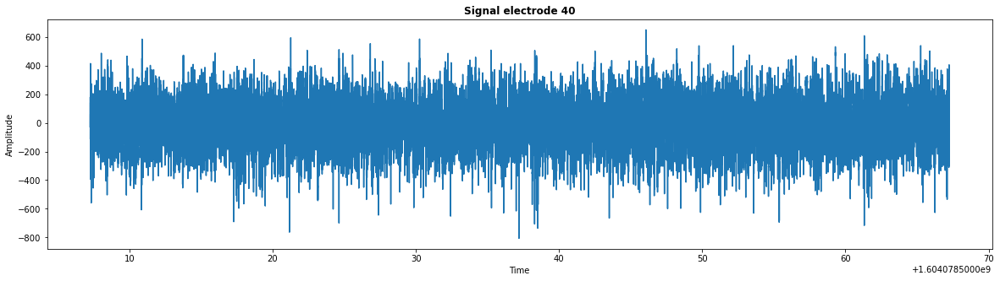

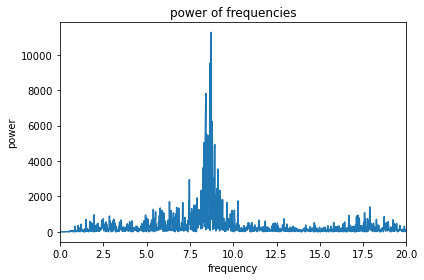

In [722]:
electrode_ix1= 1

time = x_elect_lfp[electrode_ix1]
signal = y_elect_lfp[electrode_ix1]


# frequency_of_interest = [200, 50]
sampling_frequency = 1000
# time_extent = (0, 50)
# n_time_samples = ((time_extent[1] - time_extent[0]) * sampling_frequency) + 1
# time = np.linspace(time_extent[0], time_extent[1], num=n_time_samples, endpoint=True)
# signal = np.sin(2 * np.pi * time[:, np.newaxis] * frequency_of_interest)
# signal[:n_time_samples // 2, 1] = 0 
# signal = signal.sum(axis=1)
# noise = np.random.normal(0, 4, signal.shape)

# fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(15, 9))
# axes[0, 0].plot(time, signal)
# axes[0, 0].set_xlabel('Time')
# axes[0, 0].set_ylabel('Amplitude')
# axes[0, 0].set_title('Signal', fontweight='bold')
# axes[0, 0].set_xlim((24.90, 25.10))
# axes[0, 0].set_ylim((-10, 10))
plt.figure(figsize=(20,5))
plt.plot(time, signal)
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title(f'Signal electrode {electrode_id[electrode_ix1]}', fontweight='bold')
# plt.xlim((24.90, 25.10))
# plt.ylim((-10, 10))



# axes[0, 1].plot(time, signal + noise)
# axes[0, 1].set_xlabel('Time')
# axes[0, 1].set_ylabel('Amplitude')
# axes[0, 1].set_title('Signal + Noise', fontweight='bold')
# axes[0, 1].set_xlim((24.90, 25.10))
# axes[0, 1].set_ylim((-10, 10))

m = Multitaper(signal,
               sampling_frequency=sampling_frequency,
               time_halfbandwidth_product=1,
               start_time=time[0])
c = Connectivity(fourier_coefficients=m.fft(),
                 frequencies=m.frequencies)
plt.figure()
plt.plot(c.frequencies, c.power().squeeze())
plt.title('power of frequencies')
plt.xlabel('frequency')
plt.ylabel('power')
plt.xlim((0,20))


plt.tight_layout()
cb = fig.colorbar(mesh, ax=axes.ravel().tolist(), orientation='horizontal',
                  shrink=.5, aspect=15, pad=0.1, label='Power')
# cb.outline.set_linewidth(0)

4.0


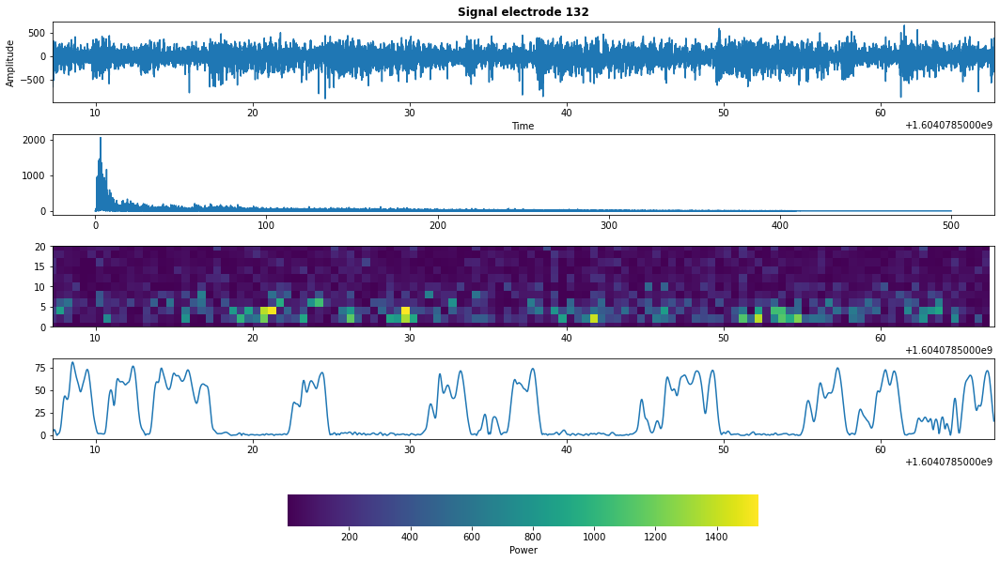

In [724]:
# frequency_of_interest = [200, 50]
electrode_ix1= 2

sampling_frequency = 1000
time_halfbandwidth_product = 1

time_data = x_elect_lfp[electrode_ix1]
signal = y_elect_lfp[electrode_ix1]
noise = np.zeros(len(x_elect_lfp[electrode_ix1]))

fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(15, 9))
axes[0].plot(time_data, signal)
axes[0].set_xlabel('Time')
axes[0].set_ylabel('Amplitude')
axes[0].set_title(f'Signal electrode {electrode_id[electrode_ix1]}', fontweight='bold')
axes[0].set_xlim(time_data[0], time_data[-1])



m = Multitaper(signal,
               sampling_frequency=sampling_frequency,
               time_halfbandwidth_product=time_halfbandwidth_product,
               # time_window_duration=.6,
               start_time=time_data[0])
c = Connectivity(fourier_coefficients=m.fft(),
                 frequencies=m.frequencies)
axes[1].plot(c.frequencies, c.power().squeeze())


m = Multitaper(signal,
               sampling_frequency=sampling_frequency,
               time_halfbandwidth_product=time_halfbandwidth_product,
               time_window_duration=.5,
               time_window_step=None,
               start_time=time_data[0])
c = Connectivity(fourier_coefficients=m.fft(),
                 frequencies=m.frequencies,
                 time=m.time)
mesh = axes[2].pcolormesh(c.time, c.frequencies, c.power().squeeze().T,
                            cmap='viridis')
axes[2].set_ylim((0, 20))
axes[2].set_xlim(time_data[0], time_data[-1])



plt.tight_layout()

cb = fig.colorbar(mesh, ax=axes.ravel().tolist(), orientation='horizontal',
                  shrink=.5, aspect=15, pad=0.1, label='Power')
cb.outline.set_linewidth(0)

axes[3].plot(x_pos,y_pos)
axes[3].set_xlim(time_data[0], time_data[-1])


print(m.frequency_resolution)

#cut off color spectrum thing at 600 or something to see smaller differences 

In [646]:
m.frequencies

array([   0.,    2.,    4.,    6.,    8.,   10.,   12.,   14.,   16.,
         18.,   20.,   22.,   24.,   26.,   28.,   30.,   32.,   34.,
         36.,   38.,   40.,   42.,   44.,   46.,   48.,   50.,   52.,
         54.,   56.,   58.,   60.,   62.,   64.,   66.,   68.,   70.,
         72.,   74.,   76.,   78.,   80.,   82.,   84.,   86.,   88.,
         90.,   92.,   94.,   96.,   98.,  100.,  102.,  104.,  106.,
        108.,  110.,  112.,  114.,  116.,  118.,  120.,  122.,  124.,
        126.,  128.,  130.,  132.,  134.,  136.,  138.,  140.,  142.,
        144.,  146.,  148.,  150.,  152.,  154.,  156.,  158.,  160.,
        162.,  164.,  166.,  168.,  170.,  172.,  174.,  176.,  178.,
        180.,  182.,  184.,  186.,  188.,  190.,  192.,  194.,  196.,
        198.,  200.,  202.,  204.,  206.,  208.,  210.,  212.,  214.,
        216.,  218.,  220.,  222.,  224.,  226.,  228.,  230.,  232.,
        234.,  236.,  238.,  240.,  242.,  244.,  246.,  248.,  250.,
        252.,  254.,

Text(0.5, 0, 'frequency')

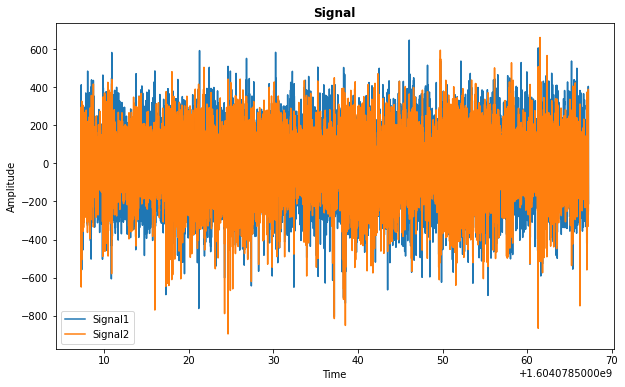

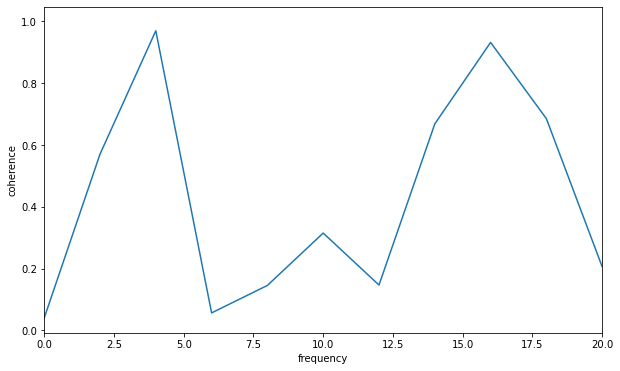

In [733]:
time_halfbandwidth_product = 1.5


electrode_ix1= 1
electrode_ix2= 2

sampling_frequency = 1000

time_data= x_elect_lfp[electrode_ix1]
signal = np.zeros((len(time_data), 2))


signal[:,0] = y_elect_lfp[electrode_ix1]
signal[:,1]=y_elect_lfp[electrode_ix2]


noise = np.zeros((len(x_elect_lfp[electrode_ix1]),2))


plt.figure(figsize=(10, 6))
# plt.subplot()
plt.title('Signal', fontweight='bold')
plt.plot(time_data, signal[:, 0], label='Signal1')
plt.plot(time_data, signal[:, 1], label='Signal2')
plt.xlabel('Time')
plt.ylabel('Amplitude')
# plt.xlim((0.95, 1.05))
# plt.ylim((-10, 10))
plt.legend()



# m = Multitaper(signal,
#                sampling_frequency=sampling_frequency,
#                time_halfbandwidth_product=time_halfbandwidth_product,
#                 time_window_duration=.5,
#                time_window_step=None,
#                start_time=time_data[0])
# c = Connectivity(fourier_coefficients=m.fft(),
#                  frequencies=m.frequencies)

m = Multitaper(signal,
               sampling_frequency=sampling_frequency,
               time_halfbandwidth_product=time_halfbandwidth_product,
               time_window_duration=.5,
               time_window_step=None,
               start_time=time_data[0])
c = Connectivity(fourier_coefficients=m.fft(),
                 frequencies=m.frequencies,
                 time=m.time)

# 
plt.figure(figsize=(10, 6))
plt.plot(c.frequencies, c.coherence_magnitude()[0, :, 0, 1])
plt.xlim(0,20)
plt.ylabel('coherence')
plt.xlabel('frequency')



#time freq tradeoff - for computing power, length of window will determine what the coherogram looks like 
#multitaper will tell what freq resolution you have 
#taper... remember the convultin with a sinc function.. aliasing. 
#mutltitaper.. 
#play with taper 

In [ ]:
 m.frequency_resolution

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


frequency resolution: 5.0


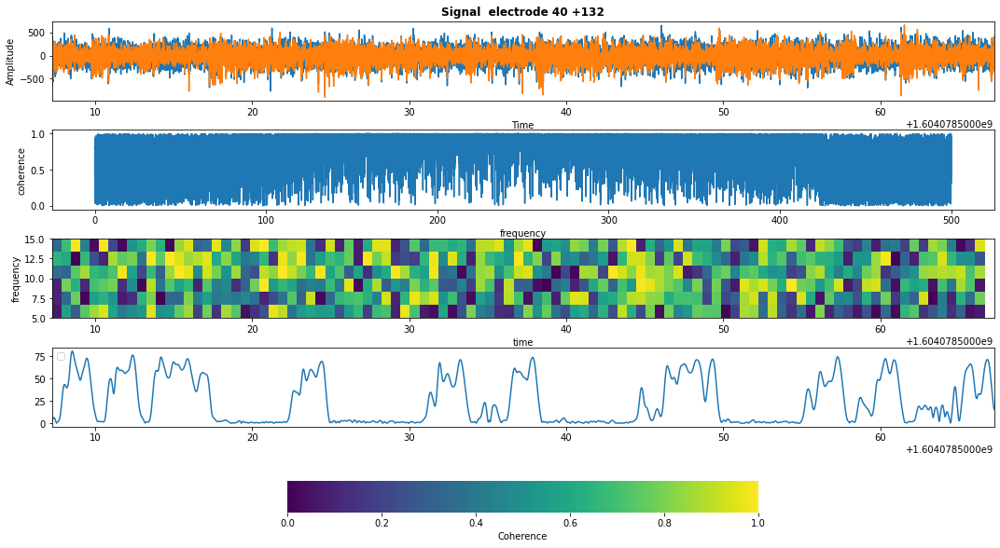

In [743]:
time_halfbandwidth_product = 1.5
# frequency_of_interest = 200
sampling_frequency = 1000
# time_extent = (0, 2.400)
n_trials = 100

electrode_ix1= 1
electrode_ix2= 2


time = x_elect_lfp[electrode_ix1]
sampling_frequency = 1000
signal = np.zeros((len(time), 2))
signal[:,0] = y_elect_lfp[electrode_ix1]
signal[:,1]=y_elect_lfp[electrode_ix2]


fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(15, 9))
axes[0].set_title(f'Signal  electrode {electrode_id[electrode_ix1]} +{electrode_id[electrode_ix2]}', fontweight='bold')
axes[0].plot(time, signal[:, 0], label='Signal1')
axes[0].plot(time, signal[:, 1], label='Signal2')
axes[0].set_xlabel('Time')
axes[0].set_ylabel('Amplitude')

axes[0].set_xlim(time[0], time[-1])
# axes[0].set_ylim((-2, 2))
plt.legend()


m = Multitaper(signal,
               sampling_frequency=sampling_frequency,
               time_halfbandwidth_product=time_halfbandwidth_product,
               start_time=time[0])

c = Connectivity(fourier_coefficients=m.fft(),
                 frequencies=m.frequencies)
axes[1].plot(c.frequencies, c.coherence_magnitude()[..., 0, 1].squeeze())
axes[1].set_ylabel('coherence')
axes[1].set_xlabel('frequency')
# axes[1].set_xlim(time[0], time[-1])




m = Multitaper(signal,
               sampling_frequency=sampling_frequency,
               time_halfbandwidth_product=time_halfbandwidth_product,
               time_window_duration=.6,
               time_window_step=None,
               start_time=time[0])
c = Connectivity(fourier_coefficients=m.fft(),
                 frequencies=m.frequencies,
                 time=m.time)
time_grid, freq_grid = np.meshgrid(
    np.append(c.time, c.time[-1]),
    np.append(c.frequencies, m.nyquist_frequency))

mesh = axes[2].pcolormesh(time_grid,freq_grid , c.coherence_magnitude()[..., 0, 1].squeeze().T,
                             vmin=0.0, vmax=1.0, cmap='viridis')
axes[2].set_ylabel('frequency')
axes[2].set_xlabel('time')
axes[2].set_ylim(0,100)
axes[2].set_xlim(time[0], time[-1])
axes[2].set_ylim(5,15)


axes[3].plot(x_pos,y_pos)
axes[3].set_xlim(time[0], time[-1])



plt.tight_layout()
cb = fig.colorbar(mesh, ax=axes.ravel().tolist(), orientation='horizontal',
                  shrink=.5, aspect=15, pad=0.1, label='Coherence')
cb.outline.set_linewidth(0)
print('frequency resolution: {}'.format(m.frequency_resolution))


#go back to the papers.. what values were they seeing? 
#go back to priority list 
#jot some notes down about the power spectra.. take note of what observations i see 

#what have a looked at, what do i need to answer my questions 


#should theta be higher in cell layer or at ref? 

In [442]:
# m.frequencies
#poke around at exactly what "8hz" means.. 
#think through what id expect at higher speed? 
#higher coh at higher speed? zoom in? good first pass! 
#drawing out the plot i want to make 
#position heatmap... coherence over time. times at those position timepoints. coherence at the times when the animal was in position bin. 
#thinking about how to average coherence over time
#maybe asking eric about the trials if i cant figure it out, looking at variables- shapes and sizes of data. 
#could try it myself, but might be easier to use hwat already exists
# but building up on the speed/[pos!] vs cooherence, get oriented with vairable im trying to work with 
#beh data doesnt have pos info! but having them both would be useful (trial times) 


#one or two top priorities: 
#big todos: (not in an order) 
# make obs about what i have done, what i have working. what am I seeing 
# looking at coherence and speed stuff. concerete, could ask question about. get plots up and running, label plots with electrodes etc metadata 
#zooming in to more individual trials 
#could do with power and speed.. correlated. look first!!! 
#draw out the plots i want to make. (or 10.. hehe depending on my top quesitons) 
#let alison know as i do them 
#trial stuff, papers, pos stuff, can be filler

In [745]:
c.frequencies

array([  0.        ,   1.66666667,   3.33333333,   5.        ,
         6.66666667,   8.33333333,  10.        ,  11.66666667,
        13.33333333,  15.        ,  16.66666667,  18.33333333,
        20.        ,  21.66666667,  23.33333333,  25.        ,
        26.66666667,  28.33333333,  30.        ,  31.66666667,
        33.33333333,  35.        ,  36.66666667,  38.33333333,
        40.        ,  41.66666667,  43.33333333,  45.        ,
        46.66666667,  48.33333333,  50.        ,  51.66666667,
        53.33333333,  55.        ,  56.66666667,  58.33333333,
        60.        ,  61.66666667,  63.33333333,  65.        ,
        66.66666667,  68.33333333,  70.        ,  71.66666667,
        73.33333333,  75.        ,  76.66666667,  78.33333333,
        80.        ,  81.66666667,  83.33333333,  85.        ,
        86.66666667,  88.33333333,  90.        ,  91.66666667,
        93.33333333,  95.        ,  96.66666667,  98.33333333,
       100.        , 101.66666667, 103.33333333, 105.  

(1,) (1, 100)


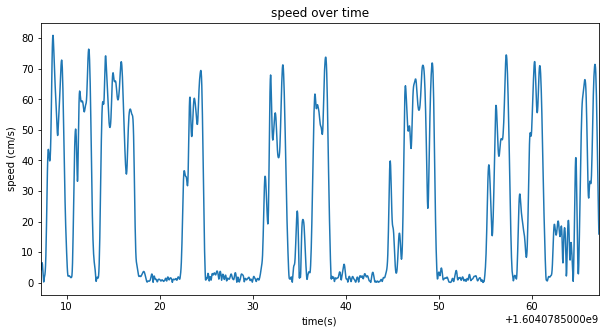

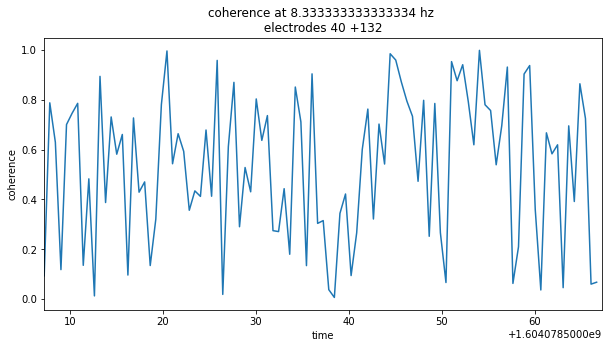

In [750]:
freq_seg = c.frequencies[(c.frequencies >= 7) & (c.frequencies <=9)]
coh_seg = c.coherence_magnitude()[..., 0, 1].squeeze().T[(c.frequencies >= 7) & (c.frequencies <=9)]

print(freq_seg.shape, coh_seg.shape)
plt.figure(figsize=(10,5))
plt.plot(x_pos,y_pos)
plt.xlabel('time(s)')
plt.ylabel('speed (cm/s)')
plt.title('speed over time')
plt.xlim(time[0], time[-1])




for ix in range(len(coh_seg)):
    plt.figure(figsize=(10,5))
    plt.plot(c.time,coh_seg[ix])
    plt.title(f'coherence at {freq_seg[ix]} hz \n electrodes {electrode_id[electrode_ix1]} +{electrode_id[electrode_ix2]} ')
    plt.xlabel('time')
    plt.ylabel('coherence')
    plt.xlim(time[0], time[-1])



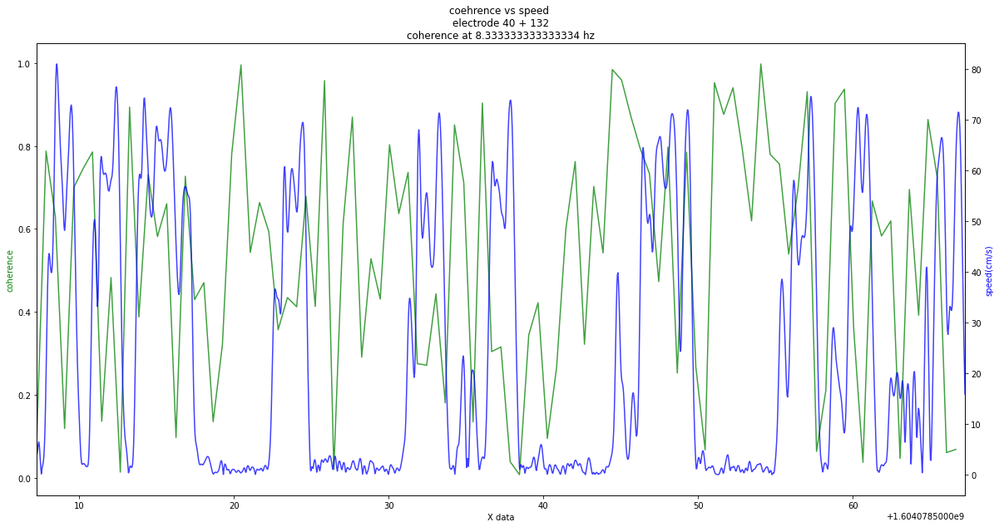

In [754]:
for ix in range(len(coh_seg)):
    fig, ax1 = plt.subplots(figsize=(20,10))
    x1 = c.time
    x2 = x_pos 
    y1=coh_seg[ix]
    y2 = y_pos

    ax2 = ax1.twinx()
    ax1.plot(x1, y1, 'g-',alpha=.75)
    ax2.plot(x2, y2, 'b-',alpha=.75)
    

    ax1.set_xlabel('X data')
    ax1.set_ylabel('coherence', color='g')
    ax2.set_ylabel('speed(cm/s)', color='b')
    ax1.set_title(f'coehrence vs speed \nelectrode {electrode_id[electrode_ix1]} + {electrode_id[electrode_ix2]}\ncoherence at {freq_seg[ix]} hz')
    ax1.set_xlim(time[0], time[-1])
    ax2.set_xlim(time[0], time[-1])




    plt.show()


In [255]:
freq_seg

array([ 8.        ,  9.33333333, 10.66666667, 12.        ])

In [251]:
len(coh_seg)

4

In [588]:
m.frequency_resolution
#this was 50.. this is too high! 

8.0

15.0

In [624]:
Connectivity?

Init signature:
Connectivity(
    fourier_coefficients,
    expectation_type='trials_tapers',
    frequencies=None,
    time=None,
)
Docstring:     
Computes brain connectivity measures based on the cross spectral
matrix.

Spectral granger methods that require estimation of transfer function
and noise covariance use minimum phase decomposition [1] to decompose
the cross spectral matrix into square roots, which then can be used to
non-parametrically estimate the transfer function and noise covariance.

Attributes
----------
fourier_coefficients : array, shape (n_time_windows, n_trials,
                                     n_tapers, n_fft_samples,
                                     n_signals)
    The compex-valued coefficients from a fourier transform. Note that
    this is expected to be the two-sided fourier coefficients
    (both the positive and negative lags). This is needed for the
    Granger-based methods to work.
expectation_type : ('trials_tapers' | 'trials' | 'tapers')
    H

In [127]:
Multitaper?
#timewindow duration- change this
#time-window_step- dont change! overlapping window, easier to debug without it (blurring this together) 
#time_halfbandwidth_product
#want a good frequency resoltion, time is realted to that. if i can use more tapers its better. 
#1 second.. good time window size.
#for. coefficient at 8hz, res of 4hz of each side 
#for theta.. 0-50 or 30hz (gamma too!) 
#for now just ylim 

Init signature:
Multitaper(
    time_series,
    sampling_frequency=1000,
    time_halfbandwidth_product=3,
    detrend_type='constant',
    time_window_duration=None,
    time_window_step=None,
    n_tapers=None,
    tapers=None,
    start_time=0,
    n_fft_samples=None,
    n_time_samples_per_window=None,
    n_time_samples_per_step=None,
    is_low_bias=True,
)
Docstring:     
Transform time-domain signal(s) to the frequency domain by using
multiple tapering windows.

Attributes
----------
time_series : array, shape (n_time_samples, n_trials, n_signals) or
                           (n_time_samples, n_signals)
sampling_frequency : float, optional
    Number of samples per time unit the signal(s) are recorded at.
time_halfbandwidth_product : float, optional
    Specifies the time-frequency tradeoff of the tapers and also the number
    of tapers if `n_tapers` is not set.
detrend_type : string or None, optional
    Subtracting a constant or a linear trend from each time window. If Non

In [ ]:
#given trial times, start and end 
#mask the coherence
#mask the position data 
# for the times of the coherence 


In [ ]:
#this is where i start the interpolating 

In [ ]:
lfp_sampling_rate = (LFPBand & {'nwb_file_name' : nwb_file_name,
                               'filter_name' : 'Ripple 150-250 Hz'}).fetch('lfp_band_sampling_rate')

# Get animal speed upsampled to LFP sampling rate
lfp_pos_df = (IntervalPositionInfo & {'nwb_file_name' : nwb_file_name,
                                      'interval_list_name' : 'pos 0 valid times',
                                      'position_info_param_name' : 'default_lfp'}).fetch1_dataframe()

# Head speed in cm/s - because that is a param of the ripple detection detection 
head_speed = np.asarray(lfp_pos_df.head_speed)

# Position timestamps in s
pos_time = lfp_pos_df.index

# Get ripple-filtered LFP
lfp_ripple_object = (LFPBand & {'nwb_file_name' : nwb_file_name,
                                'filter_name' : 'Ripple 150-250 Hz'}).fetch_nwb()[0]

# Ripple-filtered LFP in AD units
# No need to convert to volts because ripple detection occurs on standardized data
lfp_ripple = np.asarray( lfp_ripple_object['filtered_data'].data, dtype='double' )

lfp_time = lfp_ripple_object['filtered_data'].timestamps[:]

lfp_interval_list = (IntervalList & {'nwb_file_name' : nwb_file_name,
                                     'interval_list_name' : 'lfp valid times'}).fetch1('valid_times')
position_interval_list = (IntervalList & {'nwb_file_name' : nwb_file_name,
                                          'interval_list_name' : 'pos 0 valid times'}).fetch1('valid_times')

overlap_interval_list = interval_list_intersect(lfp_interval_list, position_interval_list)

pos_ind, lfp_ind = find_overlapping_times([pos_time, lfp_time], overlap_interval_list)
##############
position_df = pd.DataFrame(pos_time[pos_ind],index =pos_time[pos_ind] )
position_df['speed']= head_speed[pos_ind]

# position_df.time
position_df

new_index = pd.Index(np.unique(np.concatenate(
                (position_df.time, lfp_time[lfp_ind]))), name='time1')

new_index

speed_df = (position_df.reindex(index=new_index)
               .interpolate(method='linear')
               .reindex(index=lfp_time[lfp_ind]))
speed_df
#############
lfp_electrode_ids = lfp_ripple_object['filtered_data'].electrodes[:].index
electrode_groups = [(Electrode() & {'nwb_file_name' : nwb_file_name,
                                    'electrode_id' : lfp_electrode}).fetch1('electrode_group_name')
                     for lfp_electrode in lfp_electrode_ids]

tetrode_ind = np.asarray( [int(group_name) <= 23 for group_name in electrode_groups] )
tetrode_ind[[4, 5, 17]] = False
tetrode_ind


ripple_data_ind = np.ix_(lfp_ind, tetrode_ind)
ripple_data_ind

In [519]:
pos_interval_list =  np.array([x_pos[0], x_pos[-1]])

In [520]:
pos_interval_list

array([1.60407851e+09, 1.60407851e+09])

In [521]:
coh_interval_list = np.array([c.time[0],c.time[-1]])

In [522]:
coh_interval_list

array([1.60407851e+09, 1.60407851e+09])

In [523]:
overlap_interval_list = interval_list_intersect(coh_interval_list, pos_interval_list)

In [524]:
overlap_interval_list

array([[1.60407851e+09, 1.60407851e+09]])

In [525]:
pos_ind, coh_ind = find_overlapping_times([x_pos, c.time], overlap_interval_list)

In [526]:
pos_ind

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

In [527]:
x_pos[pos_ind]

Float64Index([ 1604078507.274421, 1604078507.3077457, 1604078507.3410707,
              1604078507.3744166, 1604078507.4077415, 1604078507.4410875,
              1604078507.4744122, 1604078507.5077372,  1604078507.541083,
              1604078507.5744076,
              ...
              1604078511.4410493,  1604078511.474374, 1604078511.5076988,
               1604078511.541045,   1604078511.57437, 1604078511.6076946,
              1604078511.6410406, 1604078511.6743655, 1604078511.7077115,
              1604078511.7410362],
             dtype='float64', name='time', length=135)

In [528]:
coh_df.index

Float64Index([ 1604078507.274421, 1604078507.3077457, 1604078507.3410707,
              1604078507.3744166, 1604078507.4077415, 1604078507.4410875,
              1604078507.4744122, 1604078507.5077372,  1604078507.541083,
              1604078507.5744076,
              ...
              1604078511.4410493,  1604078511.474374, 1604078511.5076988,
               1604078511.541045,   1604078511.57437, 1604078511.6076946,
              1604078511.6410406, 1604078511.6743655, 1604078511.7077115,
              1604078511.7410362],
             dtype='float64', name='time', length=135)

In [529]:
coh_df = pd.DataFrame(c.time[coh_ind],index =c.time[coh_ind] )
coh_df['coh']= coh_seg[0][coh_ind]



# # position_df.time
# position_df

new_index = pd.Index(np.unique(np.concatenate(
                (coh_df.index, x_pos[pos_ind]))), name='time1')

# new_index

coh_df = (coh_df.reindex(index=new_index)
               .interpolate(method='linear')
               .reindex(index=x_pos[pos_ind]))
# speed_df

In [530]:
c.time[coh_ind]
coh_seg[0][coh_ind]

array([0.98506414, 0.98080299, 0.90672512, 0.99721009, 0.91414947,
       0.93856029, 0.96917215, 0.9832352 , 0.97913758])

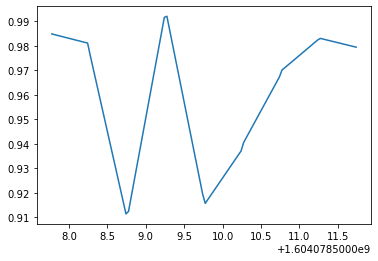

In [531]:
plt.plot(coh_df.coh)
# plt.plot(x_pos,y_pos)

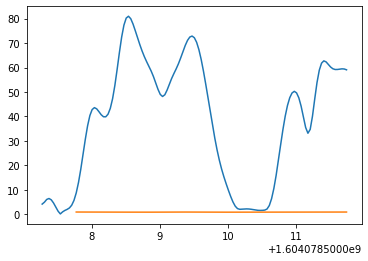

In [532]:
# plt.plot(x_pos[pos_ind],y_pos[pos_ind])
plt.plot(coh_df.index,y_pos[pos_ind])
plt.plot(coh_df.index,coh_df.coh)

ValueError: x and y must have same first dimension, but have shapes (135,) and (150,)

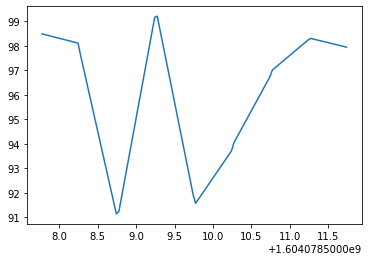

In [504]:
plt.plot(coh_df.index,coh_df.coh*100)
plt.plot(coh_df.index,y_pos)

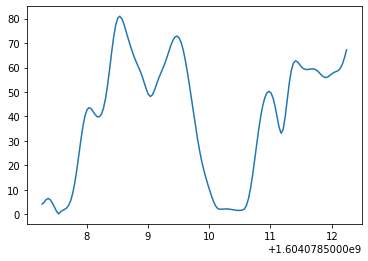

In [503]:
plt.plot(x_pos,y_pos)

In [501]:
x_pos

Float64Index([ 1604078507.274421, 1604078507.3077457, 1604078507.3410707,
              1604078507.3744166, 1604078507.4077415, 1604078507.4410875,
              1604078507.4744122, 1604078507.5077372,  1604078507.541083,
              1604078507.5744076,
              ...
              1604078511.9410276, 1604078511.9743736, 1604078512.0076985,
              1604078512.0410233, 1604078512.0743692, 1604078512.1076941,
                1604078512.14104,  1604078512.174365, 1604078512.2076898,
              1604078512.2410357],
             dtype='float64', name='time', length=150)

In [533]:
# want to restart. including pos data 

In [567]:
coh_interval_list = np.array([c.time[0],c.time[-1]])  

position_interval_list =  np.array([x_pos[0],x_pos[-1]])  

overlap_interval_list = interval_list_intersect(position_interval_list,coh_interval_list)

pos_ind, coh_ind = find_overlapping_times([x_pos,c.time], overlap_interval_list)
# ##############
# position_df = pd.DataFrame(pos_time[pos_ind],index =pos_time[pos_ind] )
# position_df['speed']= head_speed[pos_ind]

# # position_df.time
# position_df

# new_index = pd.Index(np.unique(np.concatenate(
#                 (position_df.time, lfp_time[lfp_ind]))), name='time1')

# new_index

# speed_df = (position_df.reindex(index=new_index)
#                .interpolate(method='linear')
#                .reindex(index=lfp_time[lfp_ind]))
# speed_df
# #############
# lfp_electrode_ids = lfp_ripple_object['filtered_data'].electrodes[:].index
# electrode_groups = [(Electrode() & {'nwb_file_name' : nwb_file_name,
#                                     'electrode_id' : lfp_electrode}).fetch1('electrode_group_name')
#                      for lfp_electrode in lfp_electrode_ids]

# tetrode_ind = np.asarray( [int(group_name) <= 23 for group_name in electrode_groups] )
# tetrode_ind[[4, 5, 17]] = False
# tetrode_ind


# ripple_data_ind = np.ix_(lfp_ind, tetrode_ind)
# ripple_data_ind

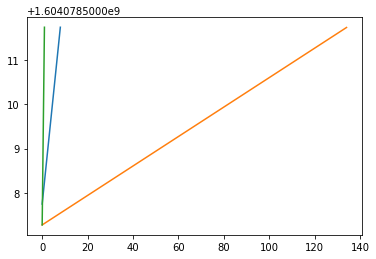

In [551]:
plt.plot(c.time[coh_ind])
plt.plot(x_pos[pos_ind])
plt.plot(overlap_interval_list[0])

In [563]:
overlap_interval_list[0][1]

1604078511.7462811

In [555]:
print(c.time[coh_ind][0],c.time[coh_ind][-1])

1604078507.7462811 1604078511.7462811


In [556]:
print(x_pos[pos_ind][0],x_pos[pos_ind][-1])

1604078507.274421 1604078511.7410362


In [557]:
def find_overlapping_times(data_list, interval_list=None):
    #this function will take datasets with different times(data_list), and will mask it based on interval_list
    #
    if interval_list is None:
        raise NotImplementedError
    
    else:
        ind_list = [None]*len(data_list)
        for ndx, data in enumerate(data_list):
            ind = np.full(data.size, False)
            for interval in interval_list:
                start_idx = np.where(data >= interval[0])[0][0]
                end_idx = np.where(data <= interval[1])[0][-1]
                ind[start_idx:end_idx+1] = True
            ind_list[ndx] = ind
    return ind_list

In [558]:
data_list = [x_pos,c.time]

In [564]:
interval_list_intersect?

Signature: interval_list_intersect(interval_list1, interval_list2, min_length=0)
Docstring:
Finds the intersections between two interval lists

Parameters
----------
interval_list1 : np.array, (N,2) where N = number of intervals
interval_list2 : np.array, (N,2) where N = number of intervals
min_length: float, optional. Minimum length of intervals to include, default 0

Each interval is (start time, stop time)

Returns
-------
interval_list: np.array, (N,2)
File:      ~/Src/nwb_datajoint/src/nwb_datajoint/common/common_interval.py
Type:      function


In [566]:
coh_interval_list

array(1.60407851e+09)

In [572]:
overlap_interval_list = interval_list_intersect(position_interval_list,coh_interval_list)



In [605]:
print(position_interval_list[0],position_interval_list[1])
print(coh_interval_list[0],coh_interval_list[1])

1604078507.274421 1604078512.2410357
1604078507.2462811 1604078511.7462811


In [ ]:
#so would expect interval list intersection to give me 1604078507.2462811, 1604078511.7462811

In [608]:
overlap_interval_list = interval_list_intersect(position_interval_list,coh_interval_list)
print(overlap_interval_list[0][0],overlap_interval_list[0][1])


1604078507.274421 1604078511.7462811


In [609]:
interval_list_intersect?

Signature: interval_list_intersect(interval_list1, interval_list2, min_length=0)
Docstring:
Finds the intersections between two interval lists

Parameters
----------
interval_list1 : np.array, (N,2) where N = number of intervals
interval_list2 : np.array, (N,2) where N = number of intervals
min_length: float, optional. Minimum length of intervals to include, default 0

Each interval is (start time, stop time)

Returns
-------
interval_list: np.array, (N,2)
File:      ~/Src/nwb_datajoint/src/nwb_datajoint/common/common_interval.py
Type:      function


In [600]:
overlap_interval_list[0][0]
overlap_interval_list[0][1]



1604078511.7462811

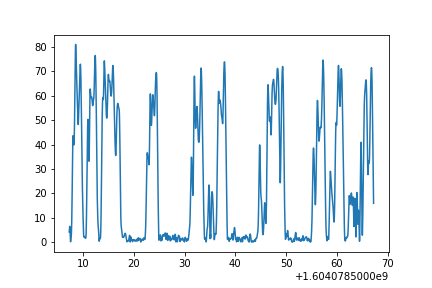

In [808]:
%matplotlib widget 
plt.plot(x_pos,y_pos)

In [809]:
start1=1604078507.56
end1=1604078510.22
start2 = 1604078510.62
end2=1604078513.28
start3 = 1604078513.55
end3=1604078517.67
trials = [[start1, end1],[start2,end2],[start3,end3]]

In [758]:
trials[0]


[1604078507.56, 1604078510.22]

In [761]:
trials[0][0]
trials[0][1]

1604078510.22

In [798]:
one_electrode_time = x_elect_lfp[electrode_ix1]
mask_start= one_electrode_time >= trials[0][0]
mask_end = one_electrode_time<= trials[0][1]

len(one_electrode_time[mask_start & mask_end])
# len(x_elect_lfp[electrode_ix1][(x_elect_lfp[electrode_ix1]>= trials[0][0]) & (x_elect_lfp[electrode_ix1]<= trials[0][1])])

2660

In [791]:
len(x_elect_lfp[electrode_ix1][ind_end])

2974

In [766]:
x_elect_lfp[electrode_ix1][trials[0][0]:trials[0][1]]

TypeError: slice indices must be integers or None or have an __index__ method

In [800]:
len(y_elect_lfp[electrode_ix1][mask_start & mask_end])


2660

In [803]:
trial_start

1604078513.55

In [818]:
len(trials)

3

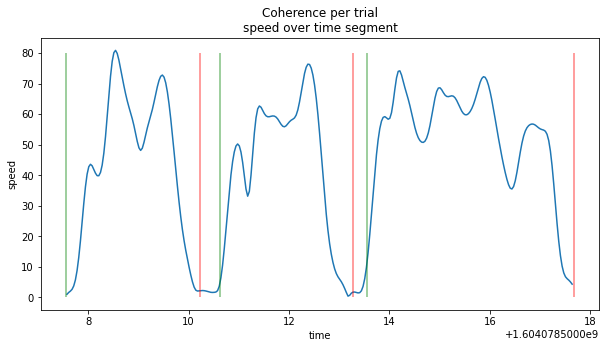

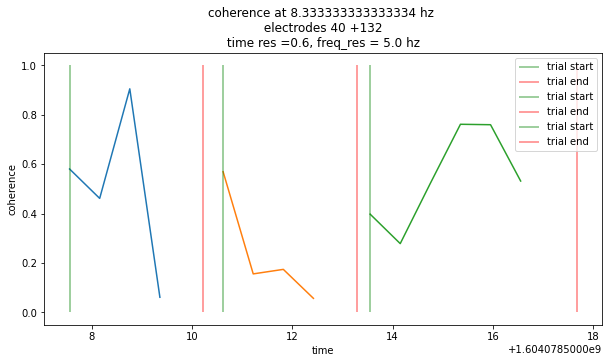

In [837]:
%matplotlib inline
electrode_ix1= 1
electrode_ix2= 2
    
time_halfbandwidth_product = 1.5
sampling_frequency = 1000
time_res = .6

plt.figure(figsize = (10,5))
pos_mask_start = x_pos>=trials[0][0]
pos_mask_end =  x_pos <= trials[len(trials)-1][1]
pos_masked_time = x_pos[pos_mask_start & pos_mask_end]
pos_masked =  y_pos[pos_mask_start & pos_mask_end]
plt.plot(pos_masked_time, pos_masked)
# plt.xlim(trials[0][0],trials[len(trials)-1][1])
plt.title('Coherence per trial\nspeed over time segment') 
plt.xlabel('time')
plt.ylabel('speed')
for ix in range(len(trials)):
    trial_start = trials[ix][0]
    trial_end = trials[ix][1]
    plt.vlines(trial_start,0,80,color='g',alpha=.5,label='trial start')
    plt.vlines(trial_end,0,80,color='r',alpha=.5,label='trial end')          

    
plt.figure(figsize = (10,5))
for ix in range(len(trials)): 
    trial_start = trials[ix][0]
    trial_end = trials[ix][1]
    
    one_electrode_time = x_elect_lfp[electrode_ix1]
    mask_start= one_electrode_time >= trial_start
    mask_end = one_electrode_time<= trial_end
    
    time_data = one_electrode_time[mask_start & mask_end]
    signal = np.zeros((len(time_data), 2))

    signal[:,0] = y_elect_lfp[electrode_ix1][mask_start & mask_end]
    signal[:,1] = y_elect_lfp[electrode_ix2][mask_start & mask_end]


    m = Multitaper(signal,
                   sampling_frequency=sampling_frequency,
                   time_halfbandwidth_product=time_halfbandwidth_product,
                   time_window_duration=time_res,
                   time_window_step=None,
                   start_time=time_data[0])
    c = Connectivity(fourier_coefficients=m.fft(),
                     frequencies=m.frequencies,
                     time=m.time)
    
    freq_seg = c.frequencies[(c.frequencies >= 7.5) & (c.frequencies <=9)]
    coh_seg = c.coherence_magnitude()[..., 0, 1].squeeze().T[(c.frequencies >= 7.5) & (c.frequencies <=9)]


    for freq in range(len(coh_seg)):
        plt.plot(c.time,coh_seg[freq])
        plt.title(f'coherence at {freq_seg[freq]} hz \n electrodes {electrode_id[electrode_ix1]} +{electrode_id[electrode_ix2]} \n time res ={time_res}, freq_res = {m.frequency_resolution} hz ')
        plt.xlabel('time')
        plt.ylabel('coherence')
        # plt.xlim(trials[0][0], trials[len(trials)-1][1])
        plt.vlines(trial_start,0,1,color='g',alpha=.5,label='trial start')
        plt.vlines(trial_end,0,1,color='r',alpha=.5,label='trial end')
        plt.legend()

        



In [822]:
len(trials)
trials[len(trials)-1]

[1604078513.55, 1604078517.67]

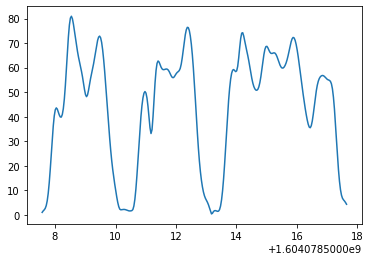

In [813]:
plt.plot(pos_masked_time, pos_masked)

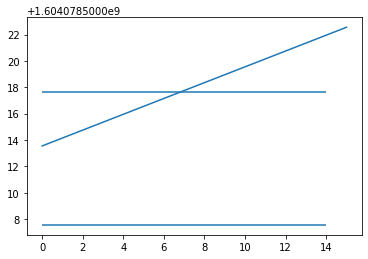

In [900]:
%matplotlib inline
electrode_ix1= 1
electrode_ix2= 2
    
time_halfbandwidth_product = 1.5
sampling_frequency = 1000
time_res = .6

time_all_start = trials[0][0]
time_all_end = trials[len(trials)-1][1]

    
one_electrode_time = x_elect_lfp[electrode_ix1]
coh_mask_all_start = one_electrode_time >= time_all_start
coh_mask_all_end = one_electrode_time <= time_all_end

masked_time_data = one_electrode_time[coh_mask_all_start & coh_mask_all_end] 


signal = np.zeros((len(masked_time_data), 2))
signal[:,0] = y_elect_lfp[electrode_ix1][coh_mask_all_start & coh_mask_all_end]
signal[:,1] = y_elect_lfp[electrode_ix2][coh_mask_all_start & coh_mask_all_end]

m = Multitaper(signal,
                sampling_frequency=sampling_frequency,
                time_halfbandwidth_product=time_halfbandwidth_product,
                time_window_duration=time_res,
                time_window_step=None,
                start_time=time_data[0])
c = Connectivity(fourier_coefficients=m.fft(),
                frequencies=m.frequencies,
                time=m.time)
    

    
# plt.figure(figsize = (10,5))
# for ix in range(len(trials)): 
#     trial_start = trials[ix][0]
#     trial_end = trials[ix][1]

#     coh_mask_start_trial = c.time >=trial_start
#     coh_mask_end_trial = c.time<=trial_end

#     masked_coh_trial = c.time[coh_mask_start_trial & coh_mask_end_trial]
#     freq_seg = c.frequencies[(c.frequencies >= 7.5) & (c.frequencies <=9)]
#     coh_seg = c.coherence_magnitude()[..., 0, 1].squeeze().T[(c.frequencies >= 7.5) & (c.frequencies <=9)]

#     coh_seg_masked = coh_seg[0][coh_mask_start_trial & coh_mask_end_trial]
#     plt.figure(figsize = (10,5))
#     plt.plot(coh_seg_masked)
# #     for freq in range(len(coh_seg)):
# #         plt.plot(c.time,coh_seg[freq])
# #         plt.title(f'coherence at {freq_seg[freq]} hz \n electrodes {electrode_id[electrode_ix1]} +{electrode_id[electrode_ix2]} \n time res ={time_res}, freq_res = {m.frequency_resolution} hz ')
# #         plt.xlabel('time')
# #         plt.ylabel('coherence')
# #         # plt.xlim(trials[0][0], trials[len(trials)-1][1])
# #         plt.vlines(trial_start,0,1,color='g',alpha=.5,label='trial start')
# #         plt.vlines(trial_end,0,1,color='r',alpha=.5,label='trial end')
# #         plt.legend()

        
plt.plot(c.time)
plt.hlines(time_all_start, 0,14)
plt.hlines(time_all_end, 0,14)





In [ ]:
# I think i just need to restart

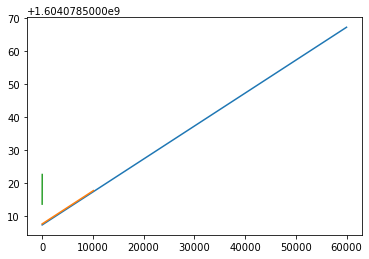

In [897]:
one_electrode_time = x_elect_lfp[electrode_ix1]
plt.plot(one_electrode_time)
plt.plot(masked_time_data)
plt.plot(c.time)
# coh_mask_all_start = one_electrode_time >= time_all_start
# coh_mask_all_end = one_electrode_time >= time_all_end

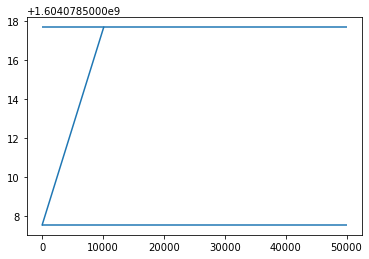

In [895]:
plt.plot(masked_time_data)
plt.hlines(trials[0][0],0,50000)
plt.hlines(trials[len(trials)-1][1],0,50000)


[[1604078507.56, 1604078510.22],
 [1604078510.62, 1604078513.28],
 [1604078513.55, 1604078517.67]]

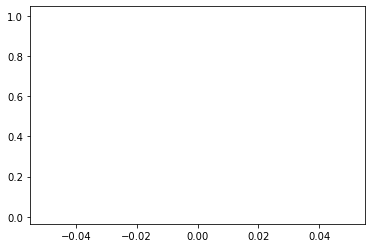

In [859]:
plt.plot(coh_seg)

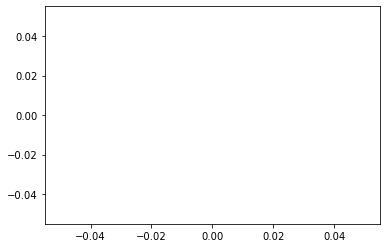

In [875]:
trial_start = trials[0][0]
trial_end = trials[0][1]
    
coh_mask_start_trial = c.time >=trial_start
coh_mask_end_trial = c.time<=trial_end

masked_coh_trial = c.time[coh_mask_start_trial & coh_mask_end_trial]
freq_seg = c.frequencies[(c.frequencies >= 7.5) & (c.frequencies <=9)]
coh_seg = c.coherence_magnitude()[..., 0, 1].squeeze().T[(c.frequencies >= 7.5) & (c.frequencies <=9)]

coh_seg_masked = coh_seg[0][coh_mask_start_trial & coh_mask_end_trial]
    
    
plt.plot(coh_seg_masked)    
# one_electrode_time = x_elect_lfp[electrode_ix1]
# coh_mask_all_start = one_electrode_time >= time_all_start
# coh_mask_all_end = one_electrode_time >= time_all_end
# masked_time_data = one_electrode_time[coh_mask_all_start & coh_mask_all_end]   

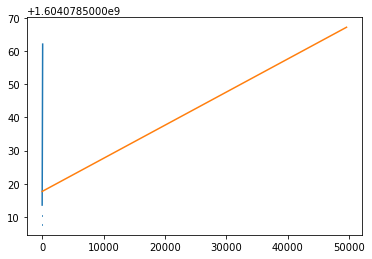

In [885]:
plt.plot(c.time)
plt.hlines(trial_start,0,80)
plt.hlines(trial_end,0,80)
plt.plot(masked_time_data)


In [881]:
coh_mask_start_trial

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True])

In [848]:
c.time[coh_mask_start_trial & coh_mask_end_trial]

array([1.60407851e+09, 1.60407851e+09, 1.60407851e+09, 1.60407852e+09,
       1.60407852e+09, 1.60407852e+09, 1.60407852e+09])

In [851]:
coh_mask_end_trial

array([ True,  True,  True,  True,  True,  True,  True, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False])

In [849]:
coh_seg [ 

array([[0.12545144, 0.99164954, 0.80347894, 0.79223936, 0.99108086,
        0.0243505 , 0.96817599, 0.88856384, 0.60653728, 0.64301602,
        0.05759742, 0.70599727, 0.31258143, 0.99652312, 0.05510212,
        0.19639149, 0.77461466, 0.52936852, 0.83868021, 0.23180164,
        0.67714767, 0.3326498 , 0.80731199, 0.50005045, 0.397557  ,
        0.7119881 , 0.28489477, 0.21233356, 0.72940233, 0.36755624,
        0.56476486, 0.81198351, 0.73526279, 0.66332398, 0.06135567,
        0.74069627, 0.10017127, 0.05874005, 0.40731327, 0.28519191,
        0.96146098, 0.56851674, 0.37467667, 0.98958807, 0.83169015,
        0.20619941, 0.94205199, 0.80671033, 0.5750951 , 0.65334406,
        0.40872466, 0.0702964 , 0.01409748, 0.40805099, 0.07779149,
        0.55330502, 0.95540839, 0.61180399, 0.84794011, 0.90166981,
        0.79875782, 0.1189889 , 0.62096058, 0.9980622 , 0.79421737,
        0.12231198, 0.32330772, 0.50879945, 0.4128557 , 0.77747906,
        0.6677945 , 0.8980211 , 0.32441027, 0.32

In [853]:
len(coh_seg[0])

82

In [855]:
len(coh_seg_masked)

7

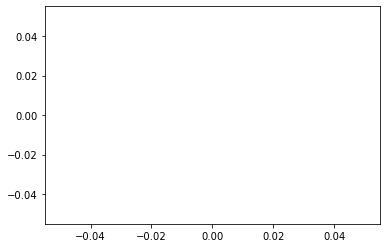

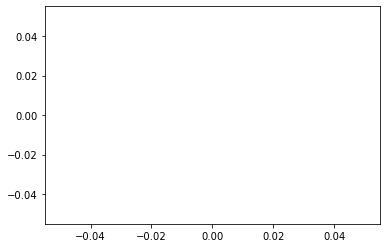

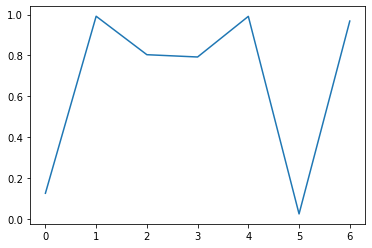

In [861]:
for ix in range(len(trials)): 
    trial_start = trials[ix][0]
    trial_end = trials[ix][1]

    coh_mask_start_trial = c.time >=trial_start
    coh_mask_end_trial = c.time<=trial_end

    masked_coh_trial = c.time[coh_mask_start_trial & coh_mask_end_trial]
    freq_seg = c.frequencies[(c.frequencies >= 7.5) & (c.frequencies <=9)]
    coh_seg = c.coherence_magnitude()[..., 0, 1].squeeze().T[(c.frequencies >= 7.5) & (c.frequencies <=9)]

    coh_seg_masked = coh_seg[0][coh_mask_start_trial & coh_mask_end_trial]
    plt.figure()
    plt.plot(coh_seg_masked)

In [862]:
trial_start

1604078513.55

In [863]:
trial_end

1604078517.67

In [865]:
print(coh_mask_start_trial , coh_mask_end_trial)

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True] [ True  True  True  True  True  True  True False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False]


In [ ]:
coh_mask_all_start = one_electrode_time >= time_all_start
coh_mask_all_end = one_electrode_time >= time_all_end
masked_time_data = one_electrode_time[coh_mask_all_start & coh_mask_all_end]   
signal = np.zeros((len(masked_time_data), 2))
signal[:,0] = y_elect_lfp[electrode_ix1][coh_mask_all_start & coh_mask_all_end]
signal[:,1] = y_elect_lfp[electrode_ix2][coh_mask_all_start & coh_mask_all_end]

In [867]:
time_all_end

1604078517.67

In [870]:
masked_time_data = one_electrode_time[coh_mask_all_start & coh_mask_all_end]   

len(masked_time_data)

49576

In [872]:
len(signal)

49576

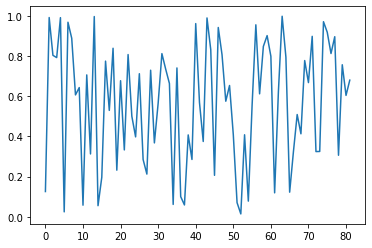

In [874]:
plt.plot(coh_seg[0])